# Digital Image Processing
## Homework 5
## Student Name: Amirmehdi Jafari Fesharaki
## Student ID: 98109645

------

## 1. Image Compression

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2 as cv

In [2]:
im_orig = np.array(Image.open("q1.jpg")).astype("double")

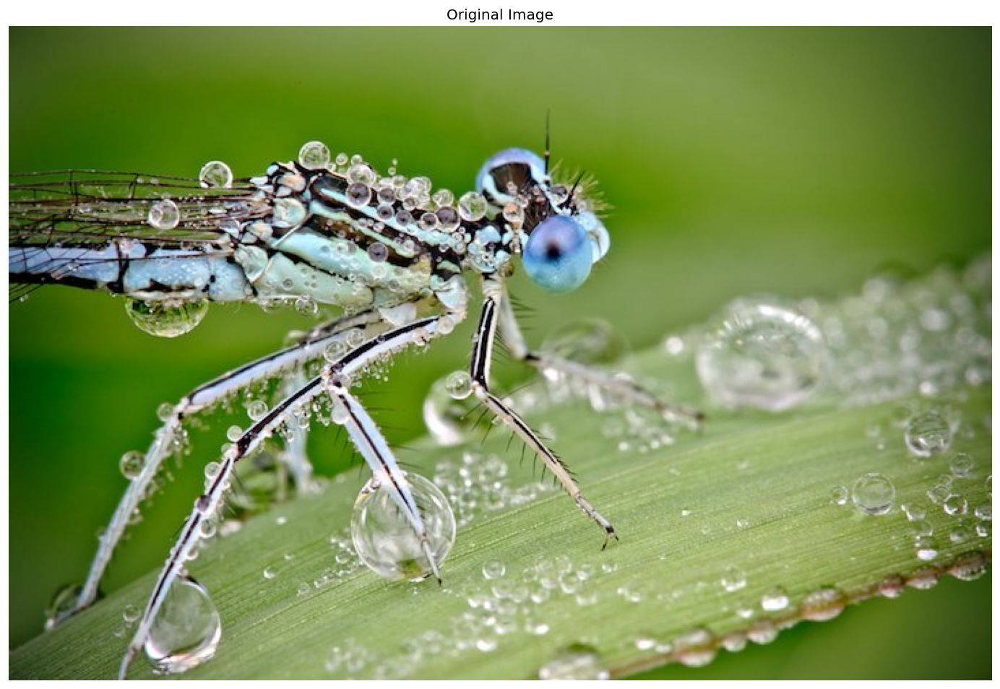

In [3]:
plt.figure(dpi=120,figsize=(15,10))
plt.imshow(im_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")
plt.show()

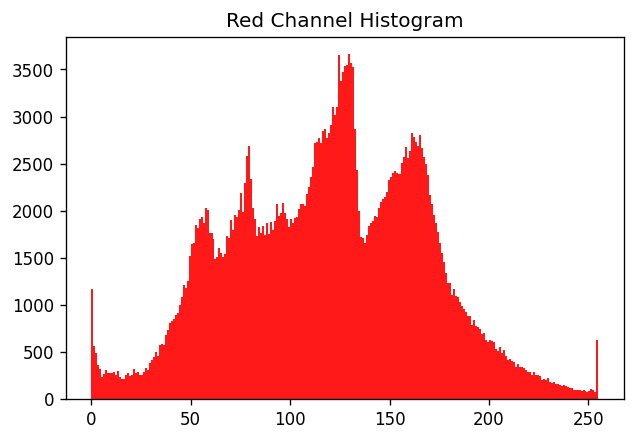

In [4]:
im_r = im_orig[:,:,0]
im_g = im_orig[:,:,1]
im_b = im_orig[:,:,2]

plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_r.flatten(), bins=255, color="r", alpha=0.9)
plt.title("Red Channel Histogram")
plt.savefig("Results/hist_r.jpg")
plt.show()

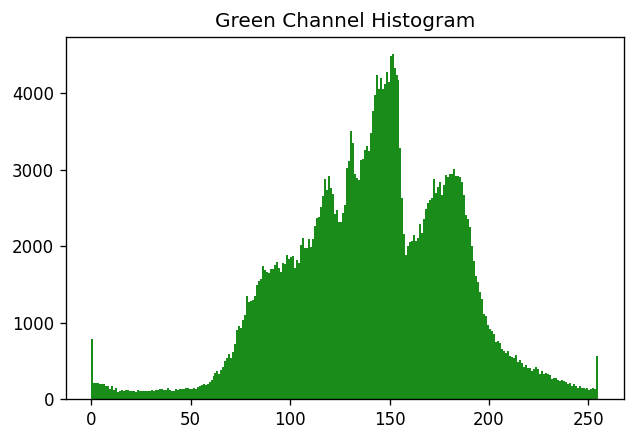

In [5]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_g.flatten(), bins=255, color="g", alpha=0.9)
plt.title("Green Channel Histogram")
plt.savefig("Results/hist_g.jpg")
plt.show()

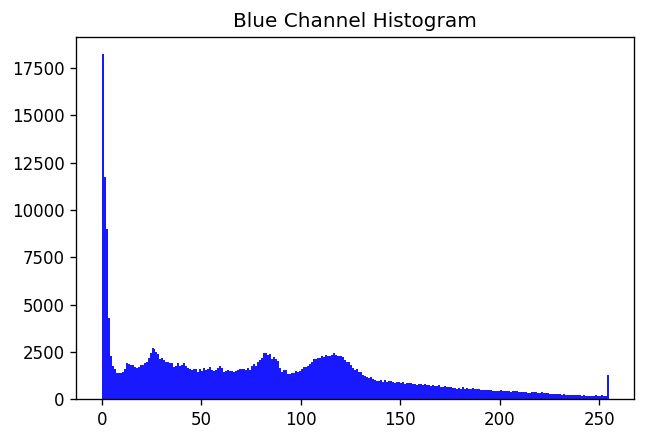

In [6]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_b.flatten(), bins=255, color="b", alpha=0.9)
plt.title("Blue Channel Histogram")
plt.savefig("Results/hist_b.jpg")
plt.show()

In [7]:
q_const = 4

im_r_clus = (im_r // q_const) * q_const 
im_g_clus = (im_g // q_const) * q_const 
im_b_clus = (im_b // q_const) * q_const 



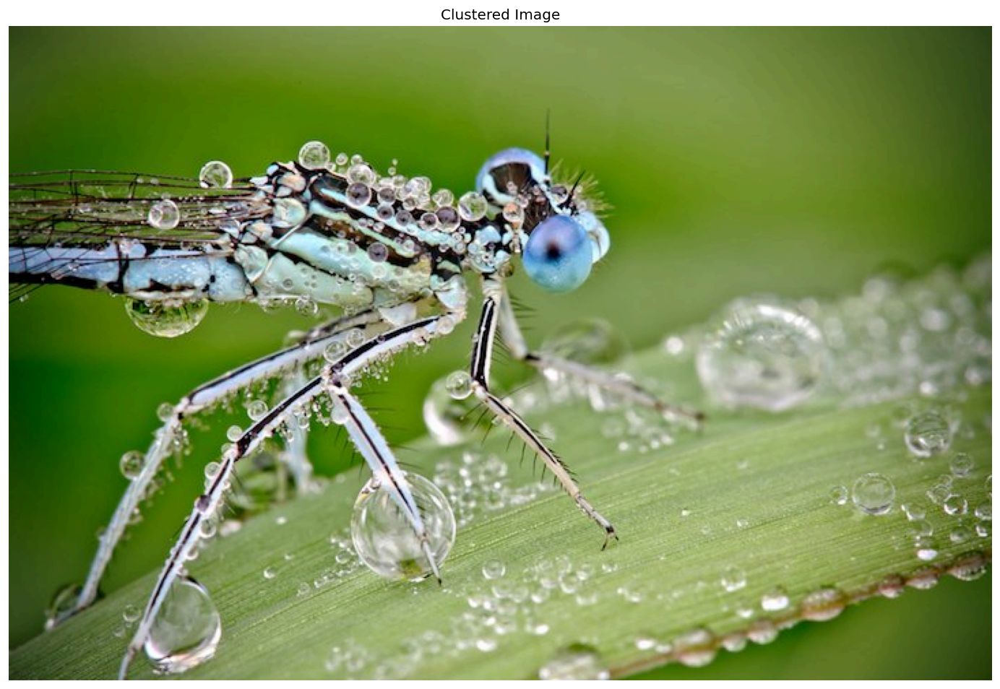

In [8]:
im_clus = np.dstack((im_r_clus, im_g_clus, im_b_clus))
Image.fromarray(im_clus.astype("uint8")).save("Results/clustered.jpg", "JPEG")
plt.figure(dpi=120,figsize=(15,10))
plt.imshow(im_clus.astype("uint8"))
plt.axis("off")
plt.title("Clustered Image")
plt.show()

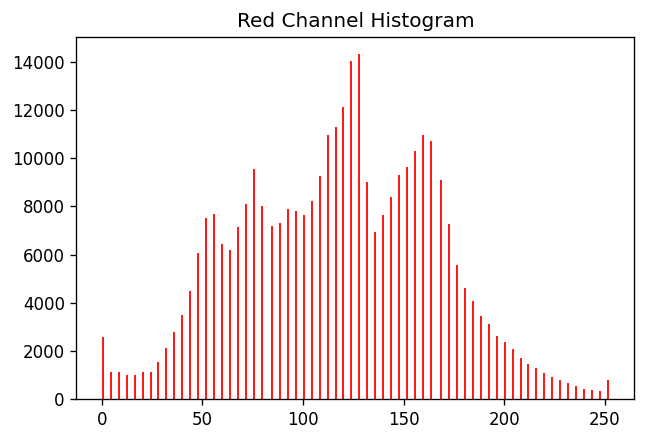

In [9]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_r_clus.flatten(), bins=255, color="r", alpha=0.9)
plt.title("Red Channel Histogram")
plt.savefig("Results/hist_r_clus.jpg")
plt.show()

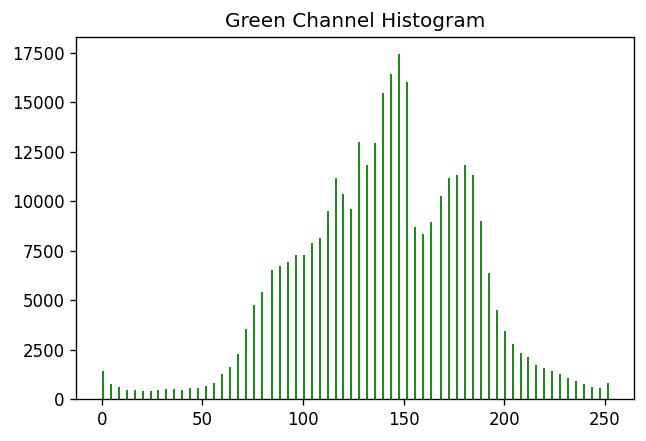

In [10]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_g_clus.flatten(), bins=255, color="g", alpha=0.9)
plt.title("Green Channel Histogram")
plt.savefig("Results/hist_g_clus.jpg")
plt.show()

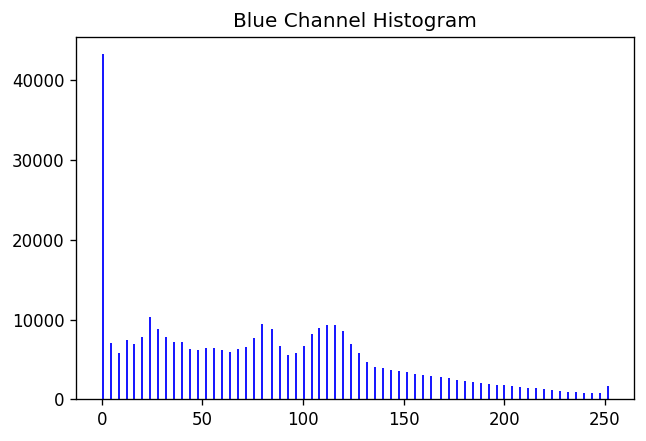

In [11]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_b_clus.flatten(), bins=255, color="b", alpha=0.9)
plt.title("Blue Channel Histogram")
plt.savefig("Results/hist_b_clus.jpg")
plt.show()

<p style="color: red"> MENTION THE RESULTS AND THE REASON BEHIND IT</p>

## 2. Dynamic Programming

---
## 3. Wavelet

In [12]:
import pywt

In [13]:
def scale_image(im):
    im_scaled = (im - im.min())/(im.max() - im.min()) * 255
    return im_scaled

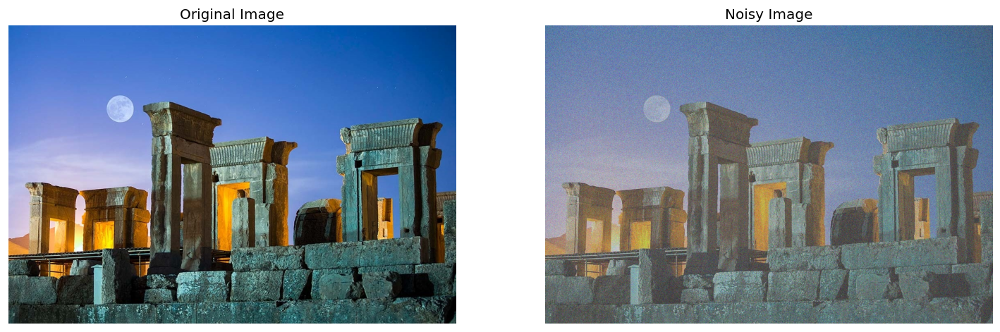

In [14]:
# loading image
im3_orig = np.array(Image.open("Q3.jpg")).astype("double")
noise_std = 30
im3_noisy = im3_orig + np.random.normal(loc=0, scale=noise_std, size=im3_orig.shape)

plt.figure(dpi=120,figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(im3_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(scale_image(im3_noisy).astype("uint8"))
plt.axis("off")
plt.title("Noisy Image")

plt.show()

### 3.1.

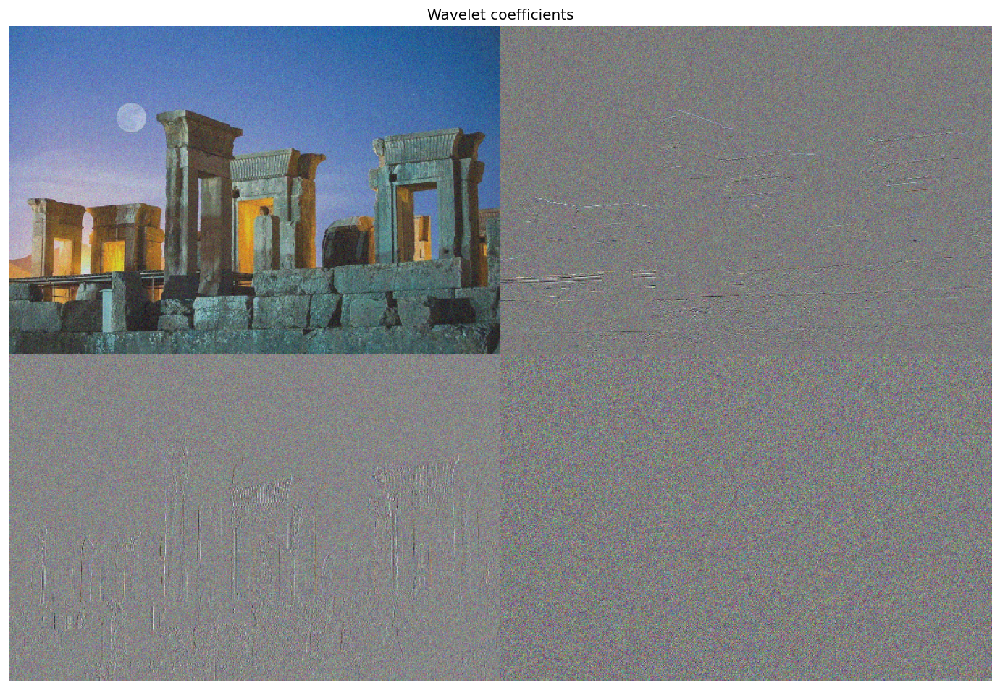

In [15]:
# wavelet image
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
coeffs2_r = pywt.dwt2(im3_noisy[:,:,0], 'haar')
coeffs2_g = pywt.dwt2(im3_noisy[:,:,1], 'haar')
coeffs2_b = pywt.dwt2(im3_noisy[:,:,2], 'haar')
LL_r, (LH_r, HL_r, HH_r) = coeffs2_r
LL_g, (LH_g, HL_g, HH_g) = coeffs2_g
LL_b, (LH_b, HL_b, HH_b) = coeffs2_b

# concatenating the coefficients to show in one image
LL = np.dstack((LL_r, LL_g, LL_b))
LH = np.dstack((LH_r, LH_g, LH_b))
HL = np.dstack((HL_r, HL_g, HL_b))
HH = np.dstack((HH_r, HH_g, HH_b))

im_wt = np.vstack((np.hstack((scale_image(LL), scale_image(LH))),np.hstack((scale_image(HL), scale_image(HH)))))
plt.figure(dpi=120, figsize=(15,10))
plt.imshow(im_wt.astype("uint8"))
plt.axis("off")
plt.title("Wavelet coefficients")
plt.show()

### 3.2.

In [16]:
def hard_thresholding(LL, LH, HL, HH, thresh_LH, thresh_HL, thresh_HH):
    '''Gets the LL, LH, HL, and HH as input and returns the hard thresholded image.'''
    
    LL_r, LL_g, LL_b = LL[:,:,0], LL[:,:,1], LL[:,:,2]
    LH_r, LH_g, LH_b = LH[:,:,0], LH[:,:,1], LH[:,:,2]
    HL_r, HL_g, HL_b = HL[:,:,0], HL[:,:,1], HL[:,:,2]
    HH_r, HH_g, HH_b = HH[:,:,0], HH[:,:,1], HH[:,:,2]
    
    # thresholding    
    LH_r[np.abs(LH_r) < thresh_LH[0]] = 0
    LH_g[np.abs(LH_g) < thresh_LH[1]] = 0
    LH_b[np.abs(LH_b) < thresh_LH[2]] = 0
    
    HL_r[np.abs(HL_r) < thresh_HL[0]] = 0
    HL_g[np.abs(HL_g) < thresh_HL[1]] = 0
    HL_b[np.abs(HL_b) < thresh_HL[2]] = 0
    
    HH_r[np.abs(HH_r) < thresh_HH[0]] = 0
    HH_g[np.abs(HH_g) < thresh_HH[1]] = 0
    HH_b[np.abs(HH_b) < thresh_HH[2]] = 0
    
    im_r = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), "haar")
    im_g = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), "haar")
    im_b = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), "haar")
    
    im = scale_image(np.dstack((im_r, im_g, im_b)))
    
    return im

def soft_thresholding(LL, LH, HL, HH, thresh_LH, thresh_HL, thresh_HH):
    '''Gets the LL, LH, HL, and HH as input and returns the soft thresholded image.'''
    
    LL_r, LL_g, LL_b = LL[:,:,0], LL[:,:,1], LL[:,:,2]
    LH_r, LH_g, LH_b = LH[:,:,0], LH[:,:,1], LH[:,:,2]
    HL_r, HL_g, HL_b = HL[:,:,0], HL[:,:,1], HL[:,:,2]
    HH_r, HH_g, HH_b = HH[:,:,0], HH[:,:,1], HH[:,:,2]
    
    # thresholding    
    LH_r[np.abs(LH_r) < thresh_LH[0]] = 0
    LH_g[np.abs(LH_g) < thresh_LH[1]] = 0
    LH_b[np.abs(LH_b) < thresh_LH[2]] = 0
    
    HL_r[np.abs(HL_r) < thresh_HL[0]] = 0
    HL_g[np.abs(HL_g) < thresh_HL[1]] = 0
    HL_b[np.abs(HL_b) < thresh_HL[2]] = 0
    
    HH_r[np.abs(HH_r) < thresh_HH[0]] = 0
    HH_g[np.abs(HH_g) < thresh_HH[1]] = 0
    HH_b[np.abs(HH_b) < thresh_HH[2]] = 0
    
    LH_r[LH_r >= thresh_LH[0]] = LH_r[LH_r >= thresh_LH[0]] - thresh_LH[0]
    LH_g[LH_g >= thresh_LH[1]] = LH_g[LH_g >= thresh_LH[1]] - thresh_LH[1]
    LH_b[LH_b >= thresh_LH[2]] = LH_b[LH_b >= thresh_LH[2]] - thresh_LH[2]
    
    HL_r[HL_r >= thresh_HL[0]] = HL_r[HL_r >= thresh_HL[0]] - thresh_HL[0]
    HL_g[HL_g >= thresh_HL[1]] = HL_g[HL_g >= thresh_HL[1]] - thresh_HL[1]
    HL_b[HL_b >= thresh_HL[2]] = HL_b[HL_b >= thresh_HL[2]] - thresh_HL[2]
    
    HH_r[HH_r >= thresh_HH[0]] = HH_r[HH_r >= thresh_HH[0]] - thresh_HH[0]
    HH_g[HH_g >= thresh_HH[1]] = HH_g[HH_g >= thresh_HH[1]] - thresh_HH[1]
    HH_b[HH_b >= thresh_HH[2]] = HH_b[HH_b >= thresh_HH[2]] - thresh_HH[2]
    
    LH_r[LH_r <= -thresh_LH[0]] = LH_r[LH_r <= -thresh_LH[0]] + thresh_LH[0]
    LH_g[LH_g <= -thresh_LH[1]] = LH_g[LH_g <= -thresh_LH[1]] + thresh_LH[1]
    LH_b[LH_b <= -thresh_LH[2]] = LH_b[LH_b <= -thresh_LH[2]] + thresh_LH[2]
    
    HL_r[HL_r <= -thresh_HL[0]] = HL_r[HL_r <= -thresh_HL[0]] + thresh_HL[0]
    HL_g[HL_g <= -thresh_HL[1]] = HL_g[HL_g <= -thresh_HL[1]] + thresh_HL[1]
    HL_b[HL_b <= -thresh_HL[2]] = HL_b[HL_b <= -thresh_HL[2]] + thresh_HL[2]
    
    HH_r[HH_r <= -thresh_HH[0]] = HH_r[HH_r <= -thresh_HH[0]] + thresh_HH[0]
    HH_g[HH_g <= -thresh_HH[1]] = HH_g[HH_g <= -thresh_HH[1]] + thresh_HH[1]
    HH_b[HH_b <= -thresh_HH[2]] = HH_b[HH_b <= -thresh_HH[2]] + thresh_HH[2]
    
    im_r = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), "haar")
    im_g = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), "haar")
    im_b = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), "haar")
    
    im = scale_image(np.dstack((im_r, im_g, im_b)))
    
    return im

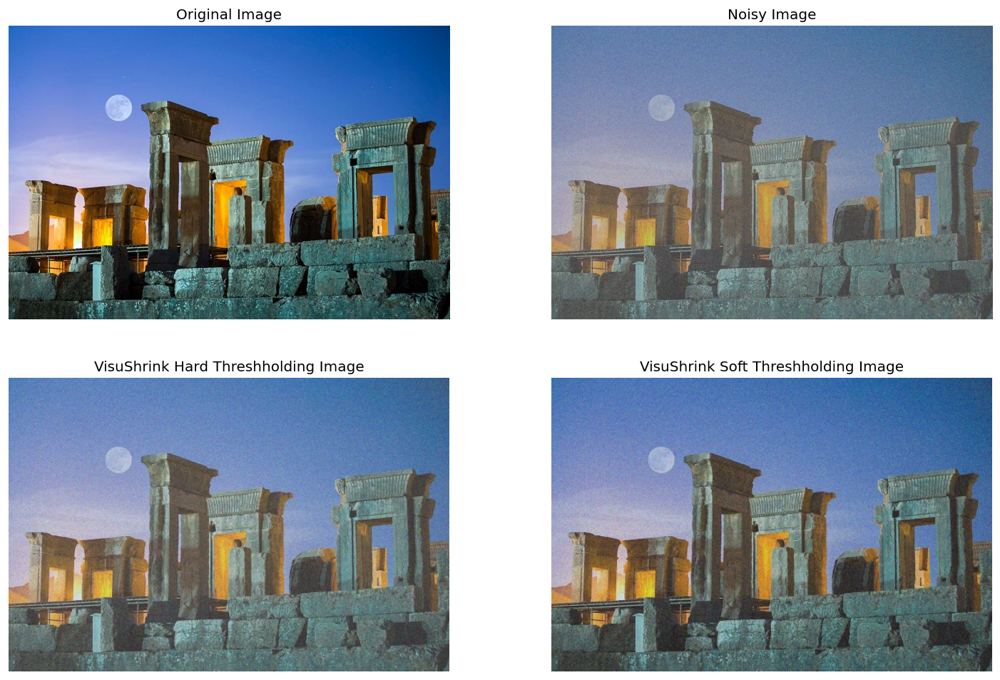

In [17]:
# finding the threshold using VisuShrink
thresh_visu = noise_std * np.sqrt(2 * np.log(im3_noisy.shape[0] * im3_noisy.shape[1]))
thresh_visu = np.array([thresh_visu, thresh_visu, thresh_visu])

# threshholding
im_visu_hard = hard_thresholding(LL, LH, HL, HH, thresh_visu, thresh_visu, thresh_visu)
im_visu_soft = soft_thresholding(LL, LH, HL, HH, thresh_visu, thresh_visu, thresh_visu)

# plotting
plt.figure(dpi=120,figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(im3_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")

plt.subplot(2,2,2)
plt.imshow(scale_image(im3_noisy).astype("uint8"))
plt.axis("off")
plt.title("Noisy Image")

plt.subplot(2,2,3)
plt.imshow(im_visu_hard.astype("uint8"))
plt.axis("off")
plt.title("VisuShrink Hard Threshholding Image")

plt.subplot(2,2,4)
plt.imshow(im_visu_soft.astype("uint8"))
plt.axis("off")
plt.title("VisuShrink Soft Threshholding Image")

plt.show()

### 3.3.

<ipython-input-18-567b3f2022d9>:10: RuntimeWarning: divide by zero encountered in true_divide
  thresh_LH_bayes = (noise_std**2) / std_LH
<ipython-input-18-567b3f2022d9>:11: RuntimeWarning: divide by zero encountered in true_divide
  thresh_HL_bayes = (noise_std**2) / std_HL
<ipython-input-18-567b3f2022d9>:12: RuntimeWarning: divide by zero encountered in true_divide
  thresh_HH_bayes = (noise_std**2) / std_HH


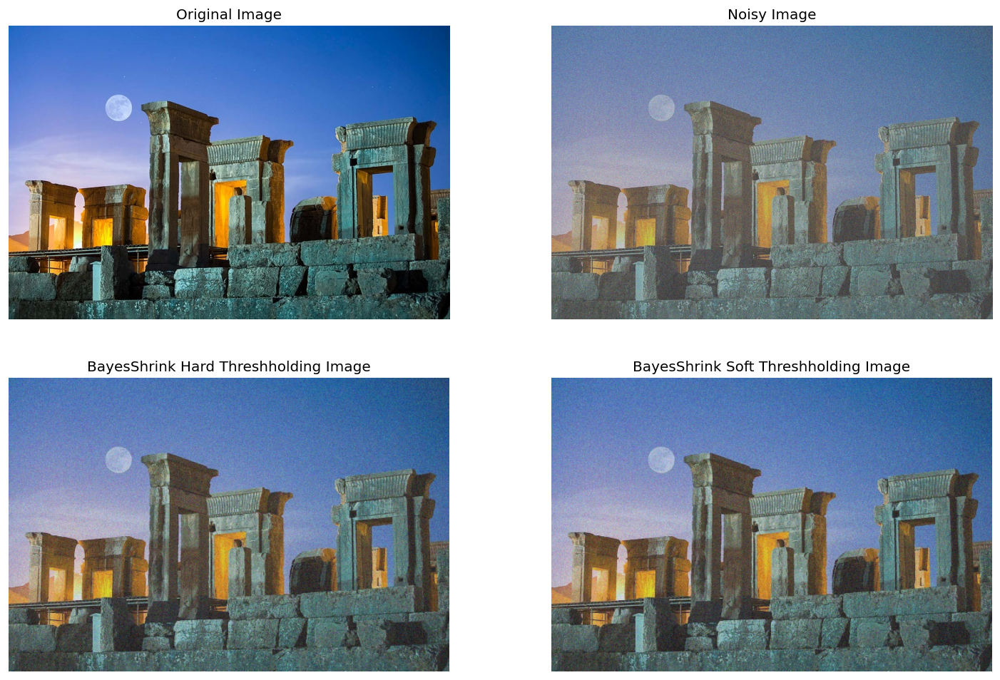

In [18]:
# finding the thresholds using BayesShrink
std_LH = np.std(LH, axis=(0,1))
std_HL = np.std(HL, axis=(0,1))
std_HH = np.std(HH, axis=(0,1))

std_LH = np.sqrt(np.max(np.array([std_LH - noise_std, [0,0,0]]), axis=0))
std_HL = np.sqrt(np.max(np.array([std_HL - noise_std, [0,0,0]]), axis=0))
std_HH = np.sqrt(np.max(np.array([std_HH - noise_std, [0,0,0]]), axis=0))

thresh_LH_bayes = (noise_std**2) / std_LH
thresh_HL_bayes = (noise_std**2) / std_HL
thresh_HH_bayes = (noise_std**2) / std_HH

thresh_LH_bayes[thresh_LH_bayes == float("inf")] = 1.7e308
thresh_HL_bayes[thresh_HL_bayes == float("inf")] = 1.7e308
thresh_HH_bayes[thresh_HH_bayes == float("inf")] = 1.7e308

# threshholding
im_bayes_hard = hard_thresholding(LL, LH, HL, HH, thresh_LH_bayes, thresh_HL_bayes, thresh_HH_bayes)
im_bayes_soft = soft_thresholding(LL, LH, HL, HH, thresh_LH_bayes, thresh_HL_bayes, thresh_HH_bayes)

# plotting
plt.figure(dpi=120,figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(im3_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")

plt.subplot(2,2,2)
plt.imshow(scale_image(im3_noisy).astype("uint8"))
plt.axis("off")
plt.title("Noisy Image")

plt.subplot(2,2,3)
plt.imshow(im_bayes_hard.astype("uint8"))
plt.axis("off")
plt.title("BayesShrink Hard Threshholding Image")

plt.subplot(2,2,4)
plt.imshow(im_bayes_soft.astype("uint8"))
plt.axis("off")
plt.title("BayesShrink Soft Threshholding Image")

plt.show()

## 3.4.
<p style="color: red"> EDIT ME </p>

---
## 4. Shannon Source Coding Theorem

### 4.1.
<p style="color: red">WRITE THE PROOF</p>
$0: 0, 250: 10, 100:110, 150:1110, 50:11110, 200:11111$

In [35]:
encode_map = {0:0, 250:10, 100:110, 150:1110, 50:11110, 200:11111}

### 4.2.

In [36]:
def InformationSource():
    '''This function simply generates a 28*28 matrix containing random values with the given probability.'''
    N = 28
    im = np.random.choice(a=[0, 250, 100, 150, 50, 200], size=(N,N), p=[1/2, 1/4, 1/8, 1/16, 1/32, 1/32])
    return im

### 4.3.

In [37]:
def SourceEncoder(im):
    '''Gets an image as input and outputs an string of the encoded image.'''
    im_flatten = im.flatten()
    encoded_list = list(map(lambda x: str(encode_map[x]), im_flatten))
    encoded_seq = ""
    for s in encoded_list:
        encoded_seq = encoded_seq + s
    return encoded_seq

### 4.4. 

In [38]:
def SourceDecoder(encoded_seq):
    '''Gets the encoded string as input and outputs the decoded image itself.'''
    seq_len = len(encoded_seq)
    im_flatten = []
    i = 0
    code = ""
    feasible_codes = list(map(str, list(encode_map.values())))
    key_list = list(encode_map.keys())
    val_list = list(encode_map.values())
    valid_code_length = 0
    while (i<seq_len):
        code = code + encoded_seq[i]
        if (code in feasible_codes):
            valid_code_length = valid_code_length + 1
            position = val_list.index(int(code))
            im_flatten.append(key_list[position])
            code = ""
        i = i+1
    N = int(valid_code_length**0.5)
    im = np.array(im_flatten).reshape((N,N))
    return im

### 4.5.

In [39]:
## testing for one image
im = InformationSource()
encoded_seq = SourceEncoder(im)
print("-----Encoded Sequence-----")
print(encoded_seq)
print('\n\n')
im_decoded = SourceDecoder(encoded_seq)

if((im == im_decoded).all()):
    print("The input and output are the same!")
else:
    print("The input and output are different!")

-----Encoded Sequence-----
1010000000110011001101101010000010111100000011011101001100100100100000100011111010010110111101001111111101101010110100010100010111011001001001000010011000000000010010010001101100011001000100111110001100100001010010101001110111001011101100011011001000110110011111011011110001100100010101100001110011010110001111011101000011011110101000100111000101011110010000111111000101101111110110011111101010101110110001011000110101101010110101000110001010011110000110010101111000101010110000110001001010001010011011110101101011011110111011000110010011101101100011101111000000111111100000001110011111011101000110100000101101010010101110111011001001001011101000000111100011010000111100000010110011010101001110001011110011110001001100101100001110011110101000111000011000100110100110011101010011111010010100000010000100101100001111110110101111101100011000110110011110000111110011111001000011010010110001111111100001111011110100101111110100000101001000100101101101110011010100011001111111101

In [40]:
## creating 10 random image 
n = 10
im_list = []
im_decoded_list = []
equality_list = []
for i in range(n):
    im_list.append(InformationSource())
    encoded_seq = SourceEncoder(im_list[i])
    im_decoded_list.append(SourceDecoder(encoded_seq))
    equality_list.append((im_list[i] == im_decoded_list[i]).all())
print("----- checking the equality of the each input and output (the i-th index refers to the i-th image) -----")
print(equality_list)

----- checking the equality of the each input and output (the i-th index refers to the i-th image) -----
[True, True, True, True, True, True, True, True, True, True]


As can be seen, the input and output are the same which shows that the encoder and decoder are working correctly.

### 4.6.

In [41]:
n = 1000
L_avg = np.zeros(n)
l_total = 0
for i in range(n):
    im_new = InformationSource()
    encoded_seq = SourceEncoder(im_new)
    l_i = len(encoded_seq)
    l_total = l_total + l_i
    L_avg[i] = l_total/(i+1)

Theoretically the final average is obtained as shown below:
$$
\begin{align}
E[L] &= 28 \times 28 \times E[l(X)] \\
&= 784 \times (1 \times \frac{1}{2} + 2 \times \frac{1}{4} + 3 \times \frac{1}{8} + 4 \times \frac{1}{16} + 5 \times \frac{1}{32} + 5 \times \frac{1}{32} \\
&= 1519
\end{align}
$$

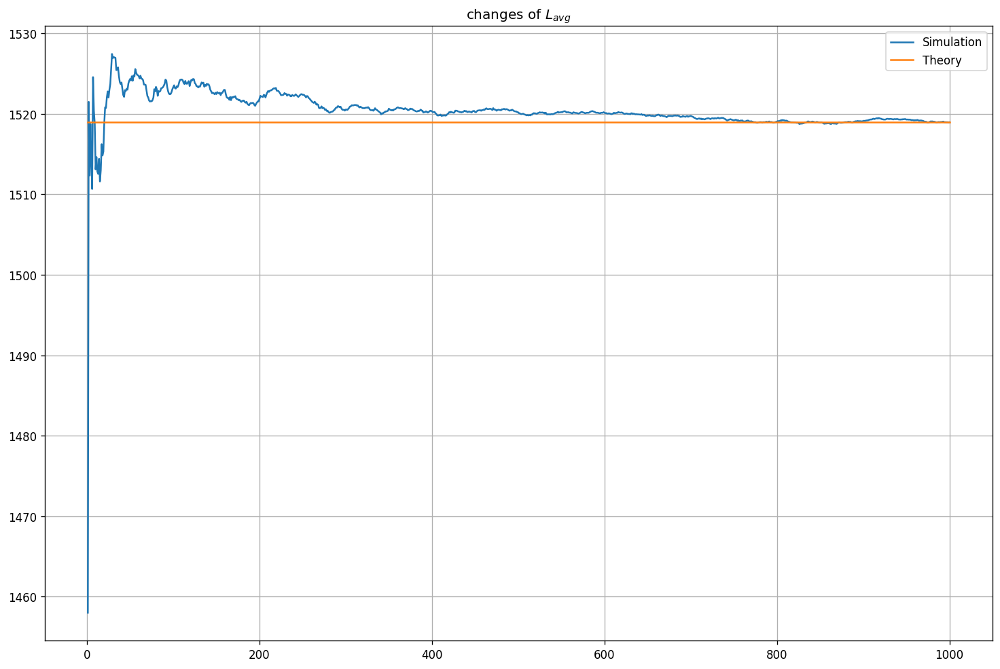

In [42]:
L_avg_theory = 28 * 28 * (1/2 + 2 * 1/4 + 3 * 1/8 + 4 * 1/16 + 5 * 1/32 + 5 * 1/32) * np.ones(n)

i = np.arange(1,n+1)
plt.figure(dpi=120, figsize=(15,10))
plt.plot(i, L_avg)
plt.plot(i, L_avg_theory)
plt.title(r"changes of $L_{avg}$")
plt.legend(["Simulation", "Theory"])
plt.grid()
plt.show()

As can be seen, the simululation shows that:
$$
\lim_{n\rightarrow \infty} L_{avg} \approx 1519 
$$
which is equal to the value which is obtained using theory.

---
## 5. Golomb Coding

In [262]:
def unary_encoder(n):
    '''gets an integer n as input and returns an unary encoded string of 0 and 1's'''
    return "1"*n + "0"

def golomb_encoder(x, m):
    '''gets integers x and m as its input and and returns an string G_m(x)'''
    q = x//m
    q_code = unary_encoder(q)
    r = x - q * m
    k = int(np.ceil(np.log2(m)))
    if (2**k == m):
        r_code = ('{0:0'+str(k)+'b}').format(int(r))
    else:
        c = 2**k - m
        if (r>=0 and r<c):
            r_code = ('{0:0'+str(k-1)+'b}').format(int(r))
        else:
            r_code = ('{0:0'+str(k)+'b}').format(int(r+c))
    code = q_code + r_code
    return code

def image_golomb_encoder(im, m):
    '''gets an image as its input and runs the golomb_encoder function of each of its pixels and returns a sequence
    of the encoded pixels'''
    N, M = im.shape
    encoded_seq = ''
    for i in range(N):
        for j in range(M):
            encoded_seq = encoded_seq + golomb_encoder(im[i,j], m)
    return encoded_seq

In [264]:
def unary_decoder(seq):
    '''gets an unary encoded sequence and return the value it represents'''
    n = seq.count("1")
    return n
    
def golomb_decoder(seq, m):
    '''gets an string which represents the golomb code of a number and returns it's decoded value ''' 
    q_code = ''
    r_code = ''
    finding_q = True
    for s in seq:
        if (finding_q):
            q_code = q_code + s
            if s == '0':
                finding_q = False
        else:
            r_code = r_code + s
    q = unary_decoder(q_code)
    r = int(r_code,2)
    k = int(np.ceil(np.log2(m)))
    if (2**k!=m and r >= 2**k - m):
        r = r - (2**k - m)
    x = q*m + r
    return x

def image_golomb_decoder(seq, m, im_shape):
    '''gets an encoded string which is a sequence of 0's and 1's, m and the desired shape of the image 
    and returns the image it is representing '''
    code = ''
    im_list = []
    k = int(np.ceil(np.log2(m)))
    if (2**k == m):
        finding_q = True
        r_counter = 0
        for s in seq:
            if (finding_q):
                code = code + s
                if s == '0':
                    finding_q = False
                    r_counter = 0
            else:
                if(r_counter < k):
                    code = code + s
                    r_counter = r_counter + 1
                    if (r_counter == k):
                        finding_q = True
                        im_list.append(golomb_decoder(code, m))
                        code = ''
    else:
        c = 2**k - m
        finding_q = True
        r_counter = 0
        r_seq = ''
        for i in range(len(seq)):
            s = seq[i]
            if (finding_q):
                code = code + s
                if s == '0':
                    finding_q = False
                    r_counter = 0
                    r_seq = ''
            else:
                if (r_counter < k-1):
                    code = code + s
                    r_counter = r_counter + 1
                    r_seq = r_seq + s
                    if (r_counter == (k-1) and i<len(seq)):
                        # checking if the length of r should be k or k-1
                        r_next = int(r_seq + seq[i+1], 2) - c
                        if (r_next < c):
                            finding_q = True
                            im_list.append(golomb_decoder(code,m))
                            code = ''
                else:
                    # this means that the length of r is k and this should be the end of the remainder sequence
                    code = code + s
                    im_list.append(golomb_decoder(code,m))
                    finding_q = True
                    code = ''
                
    im = np.array(im_list).reshape(im_shape)
    return im

For this question, the same image that has been used for question 1 is used again.

In [ ]:
# loading image
im1 = np.array(Image.open("q1.jpg")).astype("double")

In [ ]:
# encoding the image with a random m
im_shape = im1.shape
im_encoded = image_golomb_encoder(im, )

In [259]:
im = np.array([[5,2,12],[8,4,12],[2,2,9]])
image_golomb_encoder(im, 5)

'1000010110101011001111101001001010111'

In [260]:
image_golomb_decoder(image_golomb_encoder(im, 5), 5, (3,3))

array([[ 5,  2, 12],
       [ 8,  4, 12],
       [ 2,  2,  9]])

In [ ]:
xx = [['']*3]*5

1
0
0
2
0
1
